# 배터리 데이터 처리 시스템 (Refactored)

이 노트북은 `dataprocess.py` 모듈을 사용하여 데이터를 로드하고 분석합니다.
디버깅 및 시각화를 위해 대화형으로 실행할 수 있습니다.

In [25]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import dataprocess
import importlib

# 모듈 수정 시 재로딩을 위해
importlib.reload(dataprocess)

<module 'dataprocess' from 'c:\\Users\\Ryu\\Python_project\\data\\dataprocess\\dataprocess.py'>

In [26]:
# 분석할 경로 리스트 (사용자가 수정)
paths = [
    r"C:\Users\Ryu\Python_project\data\dataprocess\Rawdata\A1_MP1_4500mAh_T23_1",
    # 추가 경로를 여기에 입력하세요
    
]

print(f"분석 대상 경로 개수: {len(paths)}")

# 데이터 처리 파이프라인 실행
df_results, loaded_data = dataprocess.process_battery_data(paths)

# 결과 요약 확인
display(df_results[['folder_name', 'cycler_type', 'capacity_mAh']])

분석 대상 경로 개수: 1
🔋 배터리 데이터 처리 파이프라인 시작

[1/1] 처리 중: A1_MP1_4500mAh_T23_1
----------------------------------------------------------------------
  📁 폴더명: A1_MP1_4500mAh_T23_1
  🔧 사이클러 타입: PNE
  ⚡ 용량: 4500.0 mAh
  📊 발견된 채널: 2개
    - M02Ch073[073] 로딩 중...
      ✓ 사이클 데이터: 4,887행
      ✓ 프로파일 데이터: 571,587행
    - M02Ch074[074] 로딩 중...
      ✓ 사이클 데이터: 4,887행
      ✓ 프로파일 데이터: 571,833행

✅ 데이터 처리 완료


,folder_name,cycler_type,capacity_mAh
0,A1_MP1_4500mAh_T23_1,PNE,4500.0


## 로드된 데이터 상세 탐색

## Profile 데이터 분석

Profile 데이터를 상세히 분석하고 시각화합니다.

In [ ]:
import profile_analyzer

# 모듈 수정 시 재로딩
importlib.reload(profile_analyzer)

✅ Profile Analyzer 모듈 로딩 완료


### 1. Profile 데이터 구조 분석

KeyError: 'channel_name'

### 2. 샘플 채널 선택 및 상세 분석

In [ ]:
# 첫 번째 PNE profile 데이터 선택
if loaded_data['pne_profile']:
    sample_key = list(loaded_data['pne_profile'].keys())[0]
    sample_df = loaded_data['pne_profile'][sample_key]
    
    print(f"선택된 채널: {sample_key}")
    print(f"데이터 shape: {sample_df.shape}")
    print(f"\n컬럼 목록:")
    print(sample_df.columns.tolist())
    
    # 데이터 요약
    summary = profile_analyzer.get_profile_summary(sample_df)
    print(f"\n데이터 요약:")
    for key, value in summary.items():
        print(f"  {key}: {value}")
    
    # 처음 몇 행 표시
    print(f"\n데이터 샘플:")
    display(sample_df.head(10))
else:
    print("PNE profile 데이터가 없습니다.")




    # 'Cycle' 컬럼을 기준으로 데이터프레임을 분할하여 리스트로 저장
cycle_list = [group for _, group in df.groupby('Cycle')]

import matplotlib.cm as cm
import numpy as np

# 각 사이클마다 0부터 시작하는 time_cyc 생성
for cycle in cycle_list:
    cycle['time_cyc'] = cycle['time_s'] - cycle['time_s'].iloc[0]

mincapa = df_results['capacity_mAh'][0]

for cycle in cycle_list:
    # 시간 차이(초)를 시간(hour) 단위로 변환하여 전류(mA)와 곱한 후 누적 합산 (mAh)
    cycle['Capa_cyc'] = (cycle['Current_mA'] * cycle['time_cyc'].diff().fillna(0) / 3600).cumsum()
    cycle['Crate'] = cycle['Current_mA'] / mincapa

선택된 채널: A1_MP1_4500mAh_T23_1_M02Ch073[073]
데이터 shape: (571587, 15)

컬럼 목록:
['index', 'time_day', 'time_s', 'Voltage_V', 'Current_mA', 'Temp_C', 'ChgCap_mAh', 'DchgCap_mAh', 'Condition', 'EndState', 'step', 'Steptime_s', 'Cycle', 'time_min', 'time_hour']

데이터 요약:
  total_rows: 571587
  columns: ['index', 'time_day', 'time_s', 'Voltage_V', 'Current_mA', 'Temp_C', 'ChgCap_mAh', 'DchgCap_mAh', 'Condition', 'EndState', 'step', 'Steptime_s', 'Cycle', 'time_min', 'time_hour']
  time_range: 0.00 ~ 7696100.80 s
  voltage_range: 2998.89 ~ 4500.87 V
  current_range: -4500.32 ~ 9006.99 mA
  conditions: [2, 3, 1]
  steps: 139

데이터 샘플:


,index,time_day,time_s,Voltage_V,Current_mA,Temp_C,ChgCap_mAh,DchgCap_mAh,Condition,EndState,step,Steptime_s,Cycle,time_min,time_hour
0,1,0.000000,0.0,3784.816,0.000,23.412,0.0,0.000,2,0,2,0.0,1,0.000000,0.000000
1,2,0.000001,0.1,3759.293,-899.888,23.412,0.0,0.012,2,0,2,0.1,1,0.001667,0.000028
2,3,0.000694,60.0,3742.342,-899.952,22.959,0.0,14.987,2,0,2,60.0,1,1.000000,0.016667
3,4,0.001389,120.0,3737.240,-899.988,22.868,0.0,29.987,2,0,2,120.0,1,2.000000,0.033333
4,5,0.002083,180.0,3733.113,-899.942,22.950,0.0,44.987,2,0,2,180.0,1,3.000000,0.050000
5,6,0.002778,240.0,3729.280,-900.014,22.979,0.0,59.987,2,0,2,240.0,1,4.000000,0.066667
6,7,0.003472,300.0,3725.805,-899.966,23.029,0.0,74.987,2,0,2,300.0,1,5.000000,0.083333
7,8,0.004167,360.0,3722.745,-899.998,23.111,0.0,89.986,2,0,2,360.0,1,6.000000,0.100000
8,9,0.004861,420.0,3719.896,-900.024,23.190,0.0,104.986,2,0,2,420.0,1,7.000000,0.116667
9,10,0.005556,480.0,3717.521,-899.978,23.111,0.0,119.986,2,0,2,480.0,1,8.000000,0.133333


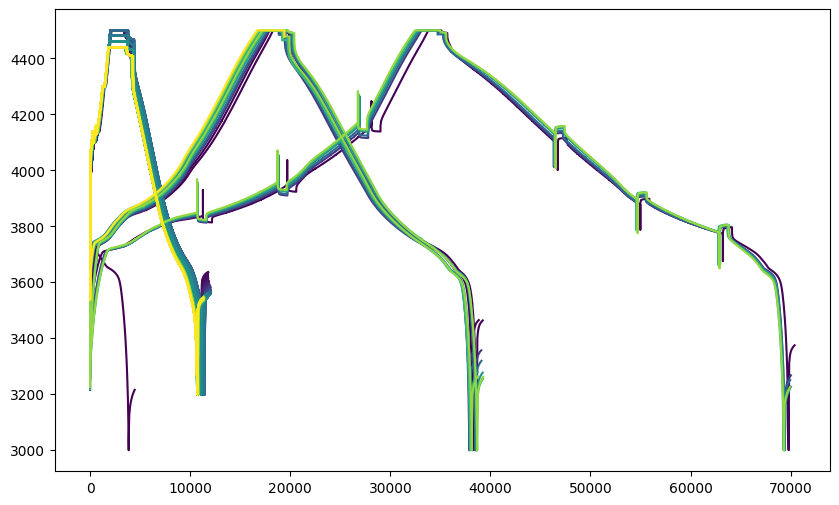

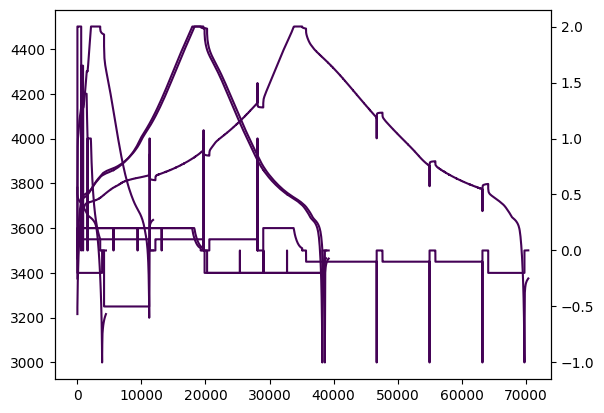

In [8]:
# 사이클 개수에 따른 그라데이션 색상 생성
colors = cm.viridis(np.linspace(0, 1, len(cycle_list)))

plt.figure(figsize=(10, 6))
for i, cycle in enumerate(cycle_list):
    plt.plot(cycle['time_cyc'], cycle['Voltage_V'], color=colors[i])
    
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

cycle_list_temp = cycle_list[:5]

for i, cycle in enumerate(cycle_list_temp):
    ax1.plot(cycle['time_cyc'], cycle['Voltage_V'], color=colors[i])    
    ax2.plot(cycle['time_cyc'], cycle['Crate'], color=colors[i])

🔬 카테고리별 데이터 특성 분석

[1단계] 각 카테고리별 특성 수집
--------------------------------------------------------------------------------

Unknown 분석 중... (2개 사이클)
  ✓ 2개 사이클 특성 추출 완료

RPT 분석 중... (6개 사이클)
  ✓ 6개 사이클 특성 추출 완료

SOC_Definition 분석 중... (5개 사이클)
  ✓ 5개 사이클 특성 추출 완료

Resistance_Measurement 분석 중... (6개 사이클)
  ✓ 6개 사이클 특성 추출 완료

Accelerated_Aging 분석 중... (581개 사이클)
  ✓ 581개 사이클 특성 추출 완료

[2단계] 카테고리별 통계 분석

[Unknown] 통계 요약 (n=2)

n_points:
  평균: 203.00 ± 175.36
  범위: [79.00, 327.00]

voltage_min:
  평균: 3288.43 ± 409.15
  범위: [2999.12, 3577.74]

voltage_max:
  평균: 4140.39 ± 509.53
  범위: [3780.09, 4500.68]

voltage_range:
  평균: 851.95 ± 100.38
  범위: [780.97, 922.94]

voltage_mean:
  평균: 3824.12 ± 404.71
  범위: [3537.95, 4110.29]

current_range:
  평균: 900.47 ± 0.17
  범위: [900.35, 900.59]

endstate_unique:
  평균: 3.00 ± 0.00
  범위: [3.00, 3.00]

endstate_64_ratio:
  평균: 0.50 ± 0.69
  범위: [0.01, 0.99]

endstate_78_ratio:
  평균: 0.00 ± 0.00
  범위: [0.00, 0.00]

charge_ratio:
  평균: 0.50 ± 0.71
  범위: [0.00,

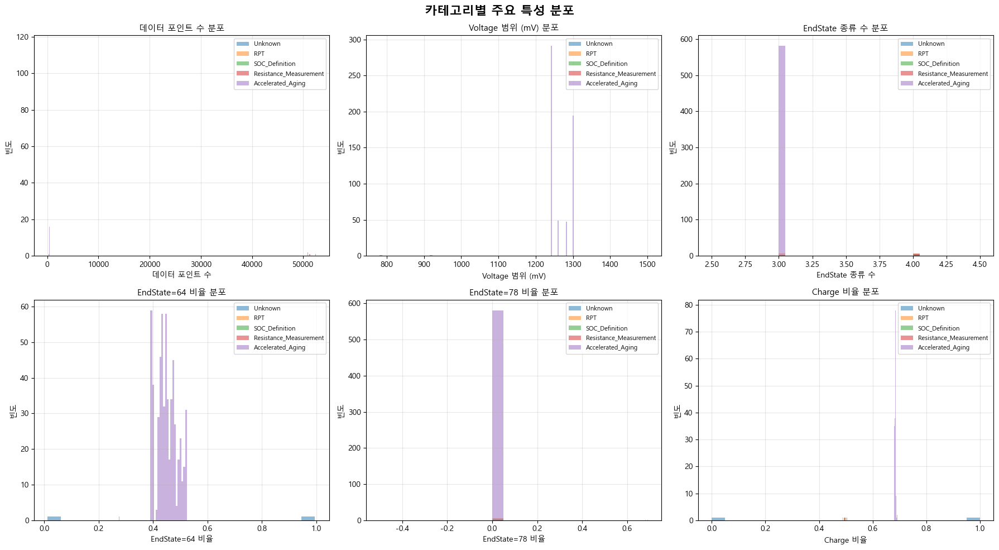


✅ 특성 분석 완료!


In [15]:
exec(open('analyze_category_features.py', encoding='utf-8').read())

In [16]:
exec(open('verify_categorization.py', encoding='utf-8').read())

🔍 사이클 분류 결과 검증

[1단계] Ground Truth 정의
--------------------------------------------------------------------------------
사용자 수동 분류 결과:
  Unknown: 2개
  RPT: 6개
  SOC_Definition: 5개
  Resistance_Measurement: 6개
  Accelerated_Aging: 581개

총 사이클 수: 600개

[2단계] 자동 분류 수행
--------------------------------------------------------------------------------
자동 분류 결과:
  Unknown: 2개
  RPT: 6개
  SOC_Definition: 6개
  Resistance_Measurement: 6개
  Accelerated_Aging: 581개

총 사이클 수: 601개

[3단계] Ground Truth와 비교
--------------------------------------------------------------------------------
✅ Unknown: 완벽히 일치 (2개)
✅ RPT: 완벽히 일치 (6개)
❌ SOC_Definition: 불일치
   추가된 사이클: [501]
✅ Resistance_Measurement: 완벽히 일치 (6개)
✅ Accelerated_Aging: 완벽히 일치 (581개)

⚠️ 검증 실패: 일부 카테고리에서 불일치가 발견되었습니다.

불일치 상세:

[SOC_Definition]
  추가: 1개 - [501]

[5단계] 개별 사이클 검증 (샘플)
--------------------------------------------------------------------------------

샘플 사이클 분류 결과:

[Unknown]
  ✅ cycle 0: Unknown
  ✅ cycle 600: Unknown

[RPT]
  ✅ cycle 1

In [18]:
exec(open('verify_categorization.py', encoding='utf-8').read())

🔍 사이클 분류 결과 검증

[1단계] Ground Truth 정의
--------------------------------------------------------------------------------
사용자 수동 분류 결과:
  Unknown: 2개
  RPT: 6개
  SOC_Definition: 5개
  Resistance_Measurement: 6개
  Accelerated_Aging: 581개

총 사이클 수: 600개

[2단계] 자동 분류 수행
--------------------------------------------------------------------------------
자동 분류 결과:
  Unknown: 3개
  RPT: 6개
  SOC_Definition: 5개
  Resistance_Measurement: 6개
  Accelerated_Aging: 581개

총 사이클 수: 601개

[3단계] Ground Truth와 비교
--------------------------------------------------------------------------------
❌ Unknown: 불일치
   추가된 사이클: [501]
✅ RPT: 완벽히 일치 (6개)
✅ SOC_Definition: 완벽히 일치 (5개)
✅ Resistance_Measurement: 완벽히 일치 (6개)
✅ Accelerated_Aging: 완벽히 일치 (581개)

⚠️ 검증 실패: 일부 카테고리에서 불일치가 발견되었습니다.

불일치 상세:

[Unknown]
  추가: 1개 - [501]

[5단계] 개별 사이클 검증 (샘플)
--------------------------------------------------------------------------------

샘플 사이클 분류 결과:

[Unknown]
  ✅ cycle 0: Unknown
  ✅ cycle 600: Unknown

[RPT]
  ✅ cycle 1: RPT
 

## 카테고리화 + plot

📊 카테고리별 모든 사이클 시각화 시작

📊 RPT 시각화 중... (6개 사이클)

📊 SOC_Definition 시각화 중... (5개 사이클)

📊 Resistance_Measurement 시각화 중... (6개 사이클)

📊 Accelerated_Aging 시각화 중... (581개 사이클)


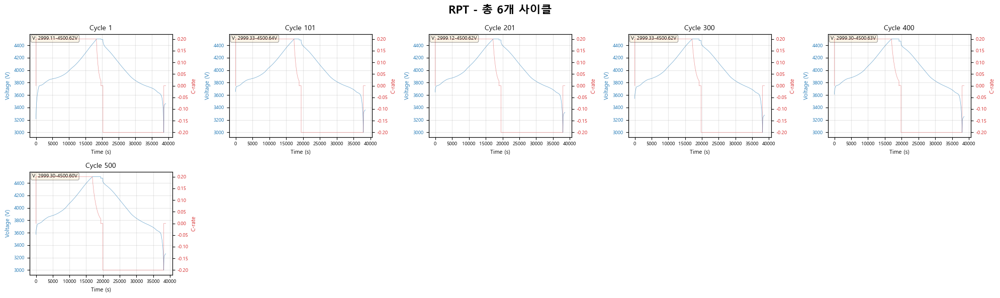

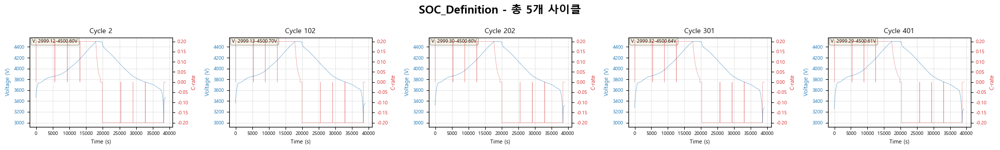

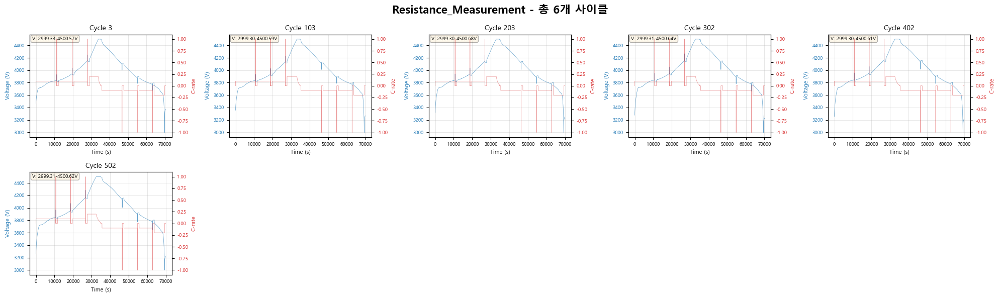

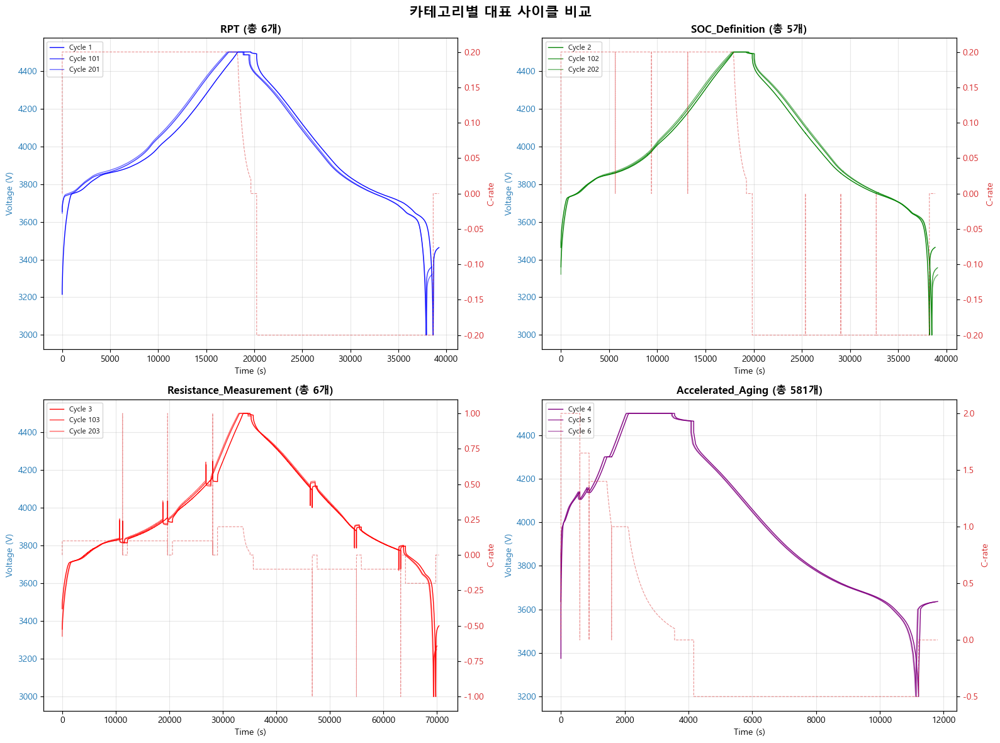

In [21]:
# ============================================================================
# 카테고리별 전체 사이클 시각화
# ============================================================================

import plot_all_categories
import importlib

# 모듈 재로딩
importlib.reload(plot_all_categories)

print("="*80)
print("📊 카테고리별 모든 사이클 시각화 시작")
print("="*80)

# 모든 카테고리의 모든 사이클 플롯 (그리드 형태)
figures = plot_all_categories.plot_all_categories(cycle_list, categories, max_cols=5)

# 카테고리별 대표 사이클 비교
comparison_fig = plot_all_categories.plot_category_comparison(cycle_list, categories)
plt.show()

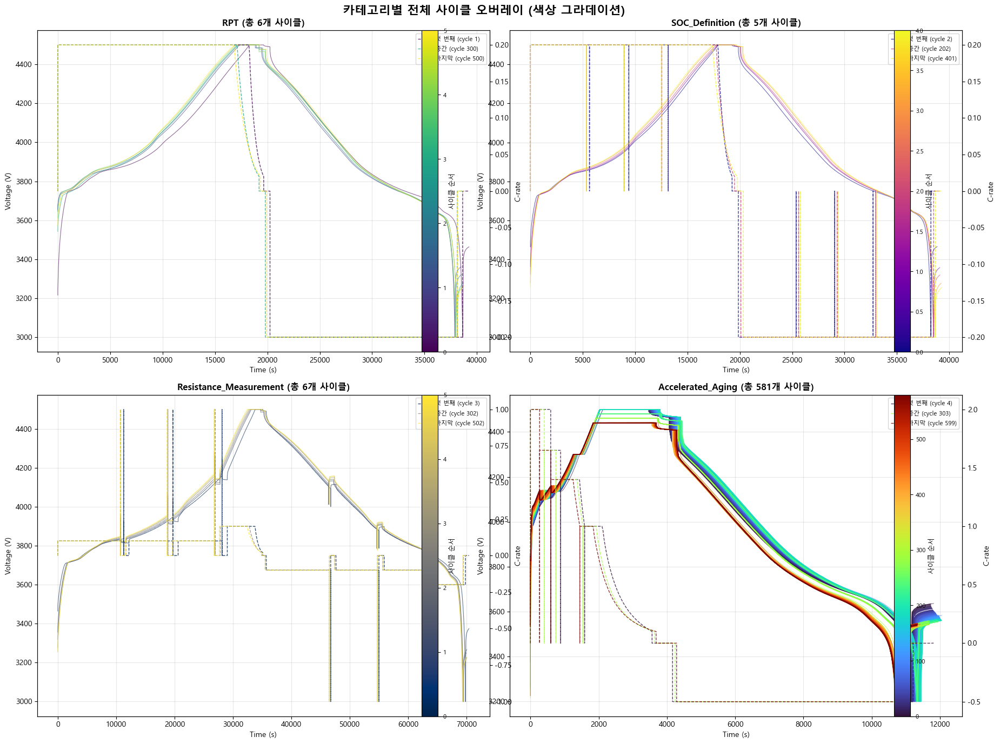

In [22]:
import plot_overlay
import importlib
importlib.reload(plot_overlay)
overlay_fig = plot_overlay.plot_category_overlay(cycle_list, categories, show_crate=True)

--- Cycle 0 'EndState' 통계 요약 ---
count    52466.000000
mean        64.018298
std          0.497366
min         64.000000
25%         64.000000
50%         64.000000
75%         64.000000
max         78.000000
Name: EndState, dtype: float64

[빈도수 분석]
EndState
64    52376
78       66
66       12
65       12
Name: count, dtype: int64
------------------------------
count    52466.000000
mean         0.001059
std          0.105853
min         -1.000011
25%         -0.100002
50%          0.099984
75%          0.100001
max          1.000795
Name: Crate, dtype: float64
count    52466.000000
mean      3969.227428
std        197.073501
min       2999.330000
25%       3821.166750
50%       3914.160000
75%       4097.666750
max       4500.567000
Name: Voltage_V, dtype: float64
count    52466.000000
mean         1.498094
std          0.504781
min          1.000000
25%          1.000000
50%          1.000000
75%          2.000000
max          3.000000
Name: Condition, dtype: float64


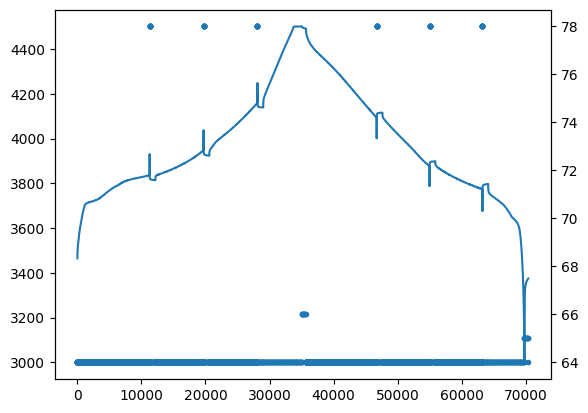

In [9]:
fig1, ax1 = plt.subplots()
ax2 = ax1.twinx()

cycle_list_temp = cycle_list[3:4]

for i, cycle in enumerate(cycle_list_temp):
    ax1.plot(cycle['time_cyc'], cycle['Voltage_V'])
    ax2.plot(cycle['time_cyc'], cycle['EndState'],'.')

import pandas as pd

# cycle_list_temp 내 각 cycle의 'EndState' 통계 분석
for i, cycle in enumerate(cycle_list_temp):
    print(f"--- Cycle {i} 'EndState' 통계 요약 ---")
    print(cycle['EndState'].describe())
    print("\n[빈도수 분석]")
    print(cycle['EndState'].value_counts())
    print("-" * 30)
    print(cycle['Crate'].describe())
    print(cycle['Voltage_V'].describe())
    print(cycle['Condition'].describe())


--- Cycle 0 'EndState' 통계 요약 ---
count    670.000000
mean      73.582090
std        6.460063
min       64.000000
25%       64.000000
50%       78.000000
75%       78.000000
max       78.000000
Name: EndState, dtype: float64

[빈도수 분석]
EndState
78    456
64    190
66     12
65     12
Name: count, dtype: int64
------------------------------


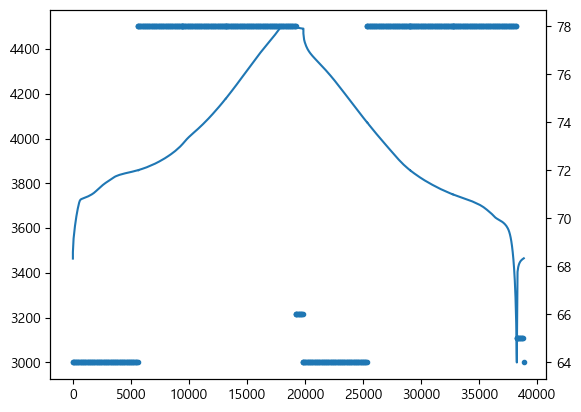

In [61]:
fig1, ax1 = plt.subplots()
ax2 = ax1.twinx()

cycle_list_temp = cycle_list[2:3]

for i, cycle in enumerate(cycle_list_temp):
    ax1.plot(cycle['time_cyc'], cycle['Voltage_V'])
    ax2.plot(cycle['time_cyc'], cycle['EndState'],'.')

import pandas as pd

# cycle_list_temp 내 각 cycle의 'EndState' 통계 분석
for i, cycle in enumerate(cycle_list_temp):
    print(f"--- Cycle {i} 'EndState' 통계 요약 ---")
    print(cycle['EndState'].describe())
    print("\n[빈도수 분석]")
    print(cycle['EndState'].value_counts())
    print("-" * 30)

--- Cycle 0 'EndState' 통계 요약 ---
count    466.000000
mean      64.654506
std        0.755447
min       64.000000
25%       64.000000
50%       64.000000
75%       65.000000
max       66.000000
Name: EndState, dtype: float64

[빈도수 분석]
EndState
64    241
65    145
66     80
Name: count, dtype: int64
------------------------------


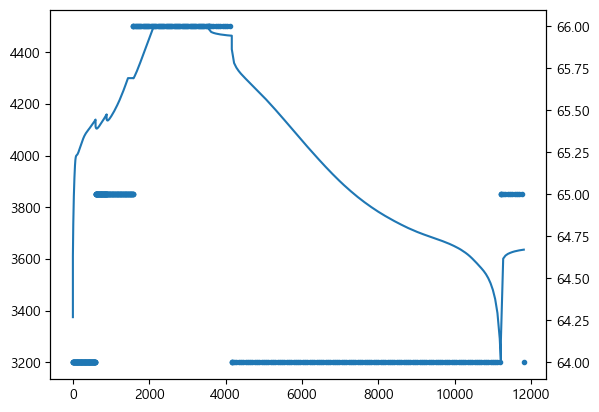

In [62]:
fig1, ax1 = plt.subplots()
ax2 = ax1.twinx()

cycle_list_temp = cycle_list[4:5]

for i, cycle in enumerate(cycle_list_temp):
    ax1.plot(cycle['time_cyc'], cycle['Voltage_V'])
    ax2.plot(cycle['time_cyc'], cycle['EndState'],'.')

import pandas as pd

# cycle_list_temp 내 각 cycle의 'EndState' 통계 분석
for i, cycle in enumerate(cycle_list_temp):
    print(f"--- Cycle {i} 'EndState' 통계 요약 ---")
    print(cycle['EndState'].describe())
    print("\n[빈도수 분석]")
    print(cycle['EndState'].value_counts())
    print("-" * 30)

--- Cycle 0 'EndState' 통계 요약 ---
count    663.000000
mean      64.054299
std        0.296111
min       64.000000
25%       64.000000
50%       64.000000
75%       64.000000
max       66.000000
Name: EndState, dtype: float64

[빈도수 분석]
EndState
64    639
66     12
65     12
Name: count, dtype: int64
------------------------------


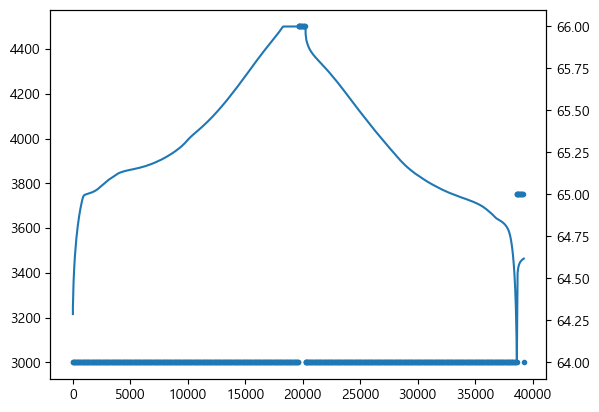

In [63]:
fig1, ax1 = plt.subplots()
ax2 = ax1.twinx()

cycle_list_temp = cycle_list[1:2]

for i, cycle in enumerate(cycle_list_temp):
    ax1.plot(cycle['time_cyc'], cycle['Voltage_V'])
    ax2.plot(cycle['time_cyc'], cycle['EndState'],'.')

import pandas as pd

# cycle_list_temp 내 각 cycle의 'EndState' 통계 분석
for i, cycle in enumerate(cycle_list_temp):
    print(f"--- Cycle {i} 'EndState' 통계 요약 ---")
    print(cycle['EndState'].describe())
    print("\n[빈도수 분석]")
    print(cycle['EndState'].value_counts())
    print("-" * 30)

📊 테스트 대상: cycle_list[:5] (총 200개 사이클)

[사이클별 기본 정보]

Cycle 0:
  - 데이터 포인트 수: 79
  - EndState 고유값 개수: 3
  - EndState 고유값: [np.int64(0), np.int64(64), np.int64(65)]
  - Condition 고유값 개수: 2
  - Condition 종류: ['방전', 'Rest']

Cycle 1:
  - 데이터 포인트 수: 663
  - EndState 고유값 개수: 3
  - EndState 고유값: [np.int64(64), np.int64(65), np.int64(66)]
  - Condition 고유값 개수: 3
  - Condition 종류: ['충전', '방전', 'Rest']

Cycle 2:
  - 데이터 포인트 수: 670
  - EndState 고유값 개수: 4
  - EndState 고유값: [np.int64(64), np.int64(65), np.int64(66), np.int64(78)]
  - Condition 고유값 개수: 3
  - Condition 종류: ['충전', '방전', 'Rest']

Cycle 3:
  - 데이터 포인트 수: 52,466
  - EndState 고유값 개수: 4
  - EndState 고유값: [np.int64(64), np.int64(65), np.int64(66), np.int64(78)]
  - Condition 고유값 개수: 3
  - Condition 종류: ['충전', '방전', 'Rest']

Cycle 4:
  - 데이터 포인트 수: 466
  - EndState 고유값 개수: 3
  - EndState 고유값: [np.int64(64), np.int64(65), np.int64(66)]
  - Condition 고유값 개수: 3
  - Condition 종류: ['충전', '방전', 'Rest']

Cycle 5:
  - 데이터 포인트 수: 452
  - EndState 고유값

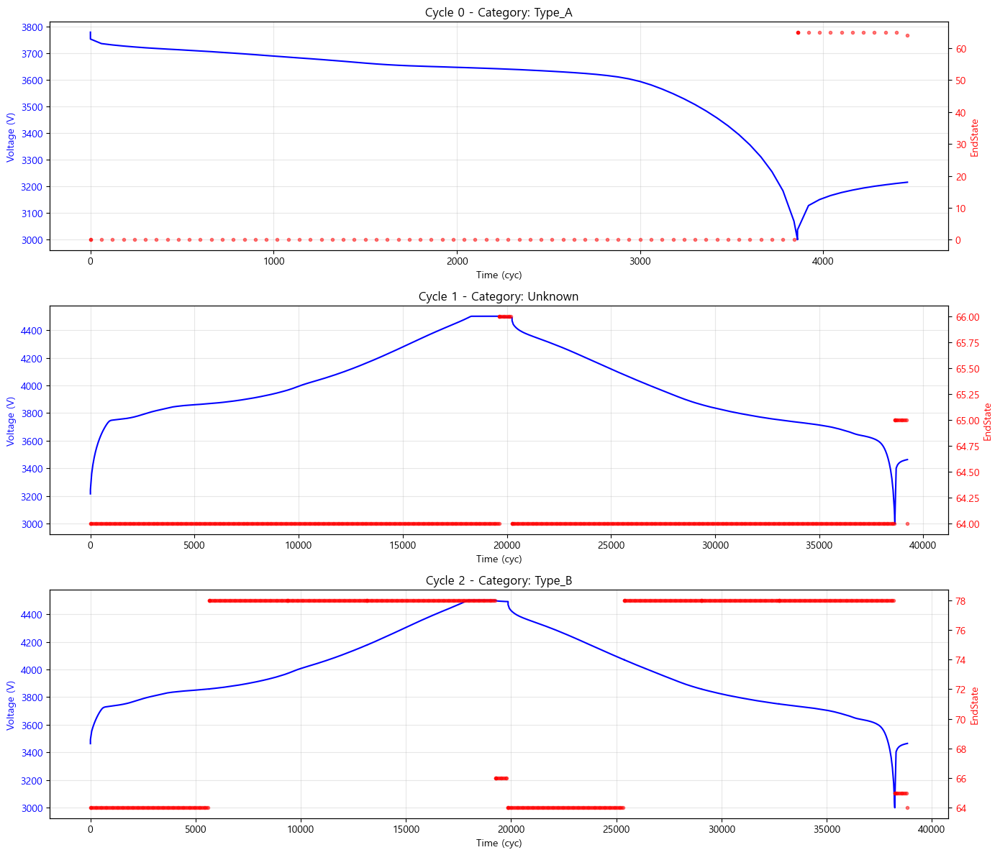


[범주별 통계 요약]
          count  avg_endstate_div  min_endstate_div  max_endstate_div  \
category                                                                
Type_A        1               3.0                 3                 3   
Type_B        4               4.0                 4                 4   
Unknown     195               3.0                 3                 3   

          avg_condition_div  min_condition_div  max_condition_div  avg_points  
category                                                                       
Type_A                  2.0                  2                  2       79.00  
Type_B                  3.0                  3                  3    26283.75  
Unknown                 3.0                  3                  3      454.64  

✅ 테스트 완료!


In [ ]:
# 1. 모듈 임포트 및 재로딩
import cycle_categorizer
import importlib
importlib.reload(cycle_categorizer)

# 2. 테스트할 사이클 선택
cycle_list_temp = cycle_list

print("=" * 80)
print(f"📊 테스트 대상: cycle_list (총 {len(cycle_list_temp)}개 사이클)")
print("=" * 80)

# 3. 각 사이클의 기본 정보 확인
print("\n[사이클별 기본 정보]")
for i, cycle in enumerate(cycle_list_temp):
    print(f"\nCycle {i}:")
    print(f"  - 데이터 포인트 수: {len(cycle):,}")
    
    if 'EndState' in cycle.columns:
        endstate_unique = len(cycle['EndState'].unique())
        print(f"  - EndState 고유값 개수: {endstate_unique}")
        print(f"  - EndState 고유값: {sorted(cycle['EndState'].unique())[:10]}")
    
    if 'Condition' in cycle.columns:
        condition_unique = len(cycle['Condition'].unique())
        condition_map = {1: '충전', 2: '방전', 3: 'Rest', 8: 'CCCV'}
        conditions = [condition_map.get(c, f'Condition {c}') for c in sorted(cycle['Condition'].unique())]
        print(f"  - Condition 고유값 개수: {condition_unique}")
        print(f"  - Condition 종류: {conditions}")

# 4. 범주화 실행
print("\n" + "=" * 80)
print("🔍 범주화 실행 중...")
print("=" * 80)

categorized_df = cycle_categorizer.categorize_all_cycles(cycle_list_temp)

# 5. 범주화 결과 출력
print("\n[범주화 결과 요약]")
print(categorized_df[['cycle_index', 'category', 'endstate_diversity', 'condition_diversity']])

# 6. 상세 보고서 출력
print("\n")
cycle_categorizer.print_categorization_report(cycle_list_temp, categorized_df)

# 7. 시각화
print("\n" + "=" * 80)
print("📈 범주별 대표 사이클 시각화")
print("=" * 80)

# 각 범주에서 하나씩 선택하여 시각화
sample_indices = []
for category in categorized_df['category'].unique():
    first_idx = categorized_df[categorized_df['category'] == category]['cycle_index'].iloc[0]
    sample_indices.append(first_idx)

cycle_categorizer.visualize_cycle_categories(cycle_list_temp, categorized_df, sample_indices)

# 8. 범주별 통계
print("\n[범주별 통계 요약]")
summary = cycle_categorizer.get_category_summary(categorized_df)
print(summary)

print("\n✅ 테스트 완료!")

In [66]:
# ============================================================================
# 전체 사이클 범주화 및 그룹화
# ============================================================================
import cycle_categorizer
import importlib
importlib.reload(cycle_categorizer)
# 1. 전체 사이클 범주화
print("🔍 전체 사이클 범주화 중...")
categorized_df = cycle_categorizer.categorize_all_cycles(cycle_list)
# 2. 범주별로 그룹화
print("\n📦 범주별로 사이클 그룹화 중...")
grouped_cycles = cycle_categorizer.group_cycles_by_category(cycle_list, categorized_df)
# 3. 그룹화 결과 요약
cycle_categorizer.print_grouped_cycles_summary(grouped_cycles)
# 4. 범주화 결과 DataFrame 확인
print("\n[범주화 결과 DataFrame]")
display(categorized_df.head(10))
# 5. 각 범주에 속한 사이클 인덱스 확인
print("\n" + "=" * 80)
print("📋 범주별 사이클 인덱스")
print("=" * 80)
for category in sorted(grouped_cycles.keys()):
    indices = categorized_df[categorized_df['category'] == category]['cycle_index'].tolist()
    print(f"\n{category}: {len(indices)}개")
    print(f"  인덱스: {indices[:20]}{'...' if len(indices) > 20 else ''}")
print("\n✅ 범주화 완료!")
print(f"   - grouped_cycles 딕셔너리에 범주별 사이클 저장됨")
print(f"   - 사용 예: grouped_cycles['Type_A'][0] (Type_A의 첫 번째 사이클)")

🔍 전체 사이클 범주화 중...

📦 범주별로 사이클 그룹화 중...
📦 범주별 사이클 그룹화 결과

총 사이클 수: 601
범주 수: 3

--------------------------------------------------------------------------------

【Type_A】
  사이클 개수: 2
  비율: 0.3%
  평균 데이터 포인트: 203
  최소/최대 포인트: 79 / 327

【Type_B】
  사이클 개수: 12
  비율: 2.0%
  평균 데이터 포인트: 26,001
  최소/최대 포인트: 670 / 52,466

【Unknown】
  사이클 개수: 587
  비율: 97.7%
  평균 데이터 포인트: 442
  최소/최대 포인트: 422 / 663


[범주화 결과 DataFrame]


,cycle_index,category,endstate_diversity,condition_diversity,total_points,endstate_most_common,condition_most_common,endstate_unique,condition_unique
0,0,Type_A,3,2,79,0,2,"[0, 64, 65]","[2, 3]"
1,1,Unknown,3,3,663,64,1,"[64, 65, 66]","[1, 2, 3]"
2,2,Type_B,4,3,670,78,1,"[64, 65, 66, 78]","[1, 2, 3]"
3,3,Type_B,4,3,52466,64,1,"[64, 65, 66, 78]","[1, 2, 3]"
4,4,Unknown,3,3,466,64,1,"[64, 65, 66]","[1, 2, 3]"
5,5,Unknown,3,3,452,64,1,"[64, 65, 66]","[1, 2, 3]"
6,6,Unknown,3,3,453,64,1,"[64, 65, 66]","[1, 2, 3]"
7,7,Unknown,3,3,453,64,1,"[64, 65, 66]","[1, 2, 3]"
8,8,Unknown,3,3,454,64,1,"[64, 65, 66]","[1, 2, 3]"
9,9,Unknown,3,3,454,64,1,"[64, 65, 66]","[1, 2, 3]"



📋 범주별 사이클 인덱스

Type_A: 2개
  인덱스: [0, 600]

Type_B: 12개
  인덱스: [2, 3, 102, 103, 202, 203, 301, 302, 401, 402, 501, 502]

Unknown: 587개
  인덱스: [1, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]...

✅ 범주화 완료!
   - grouped_cycles 딕셔너리에 범주별 사이클 저장됨
   - 사용 예: grouped_cycles['Type_A'][0] (Type_A의 첫 번째 사이클)


📊 사이클 범주화 결과 보고서 (EndState + Condition 기반)

총 사이클 수: 601
범주 수: 3

범주별 요약 통계
          count  avg_endstate_div  min_endstate_div  max_endstate_div  \
category                                                                
Type_A        2               3.0                 3                 3   
Type_B       12               4.0                 4                 4   
Unknown     587               3.0                 3                 3   

          avg_condition_div  min_condition_div  max_condition_div  avg_points  
category                                                                       
Type_A                  1.5                  1                  2      203.00  
Type_B                  3.0                  3                  3    26000.67  
Unknown                 3.0                  3                  3      441.94  

범주별 상세 정보

【Type_A】
  사이클 개수: 2
  사이클 인덱스: [0, 600]
  평균 EndState 다양성: 3.00
  평균 Condition 다양성: 1.50

  예시 (Cycle 0) 상세 분석:
    [EndState 분포]
      - EndStat

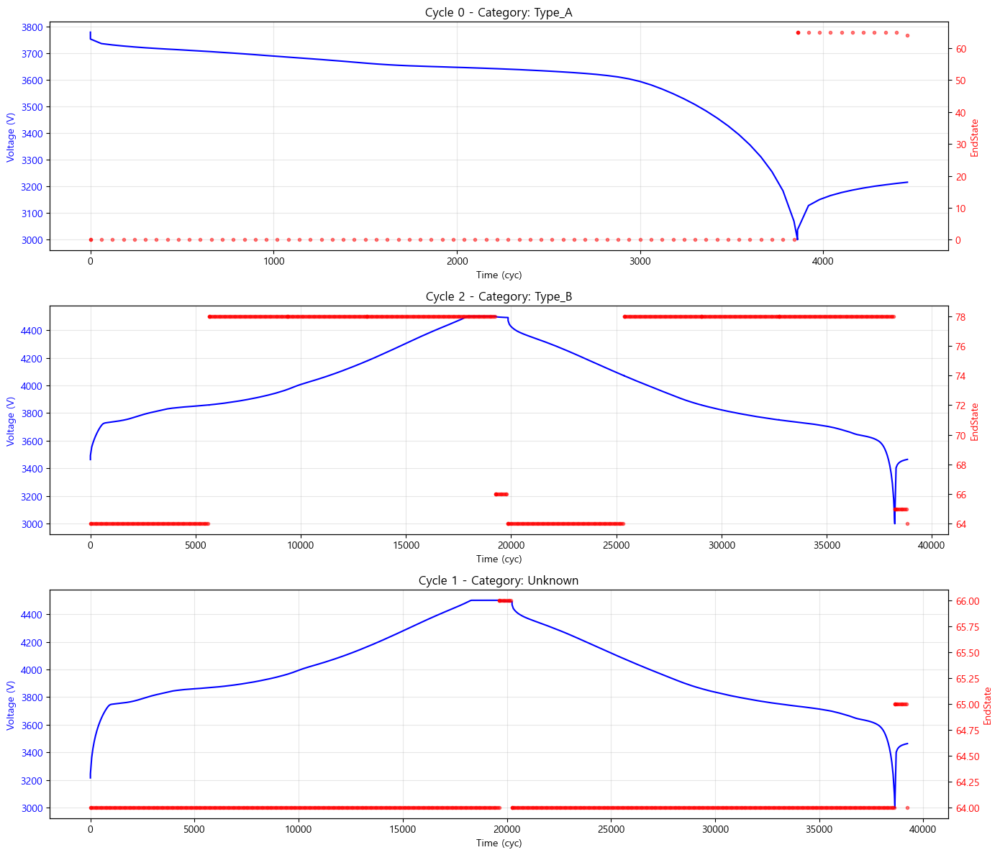

In [67]:
# ============================================================================
# 범주별 상세 분석 및 시각화
# ============================================================================
# 상세 보고서 출력
cycle_categorizer.print_categorization_report(cycle_list, categorized_df)
# 각 범주에서 대표 사이클 시각화
print("\n📈 범주별 대표 사이클 시각화")
sample_indices = []
for category in sorted(categorized_df['category'].unique()):
    first_idx = categorized_df[categorized_df['category'] == category]['cycle_index'].iloc[0]
    sample_indices.append(first_idx)
cycle_categorizer.visualize_cycle_categories(cycle_list, categorized_df, sample_indices)

### 3. Condition 분포 시각화

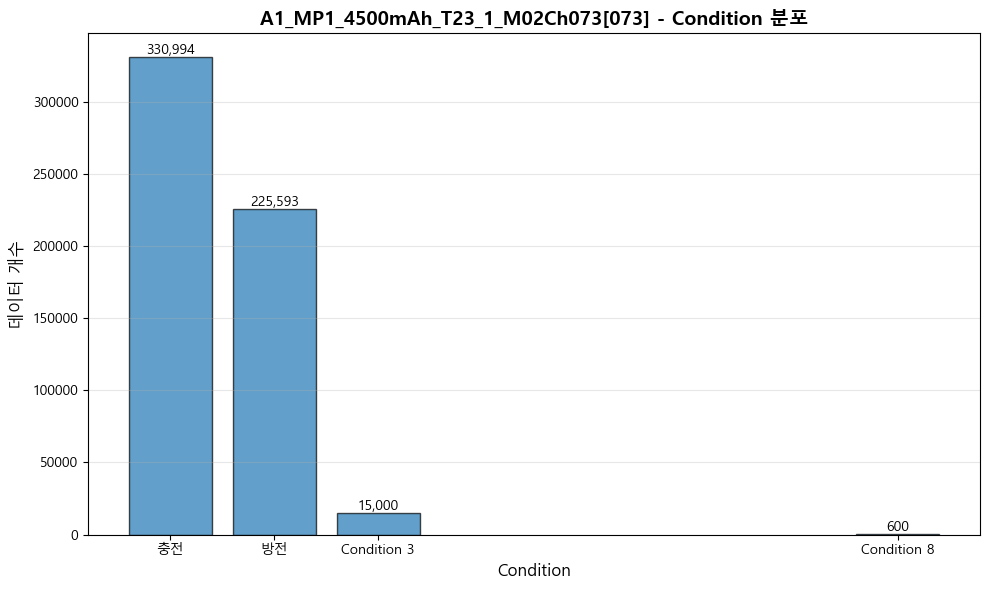

In [15]:
# Condition 분포 시각화
if 'sample_df' in locals():
    profile_analyzer.visualize_condition_distribution(sample_df, 
                                                      title=f"{sample_key} - Condition 분포")
else:
    print("⚠️  샘플 데이터가 없습니다.")

### 4. 전체 Profile 개요 시각화

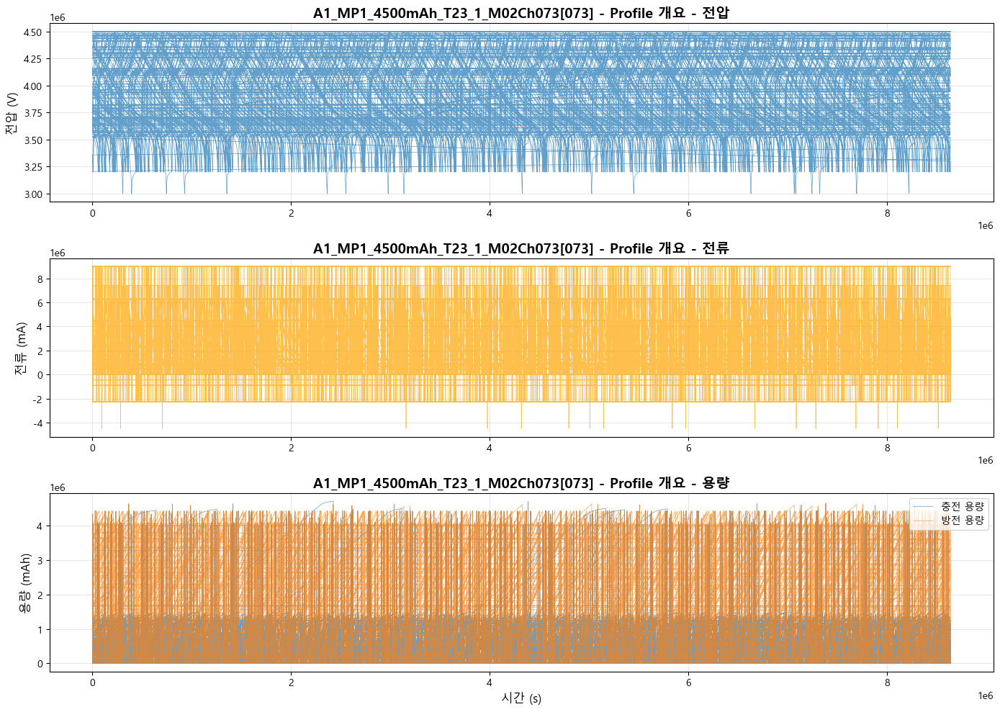

In [16]:
# 전체 profile 개요 시각화
if 'sample_df' in locals():
    profile_analyzer.visualize_profile_overview(sample_df, 
                                               title=f"{sample_key} - Profile 개요")
else:
    print("⚠️  샘플 데이터가 없습니다.")

### 5. 충전 데이터 필터링 및 분석

✓ 충전 데이터 필터링: 330,994행 (전체의 57.8%)


c:\Users\Ryu\Python_project\data\dataprocess\profile_analyzer.py:288: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


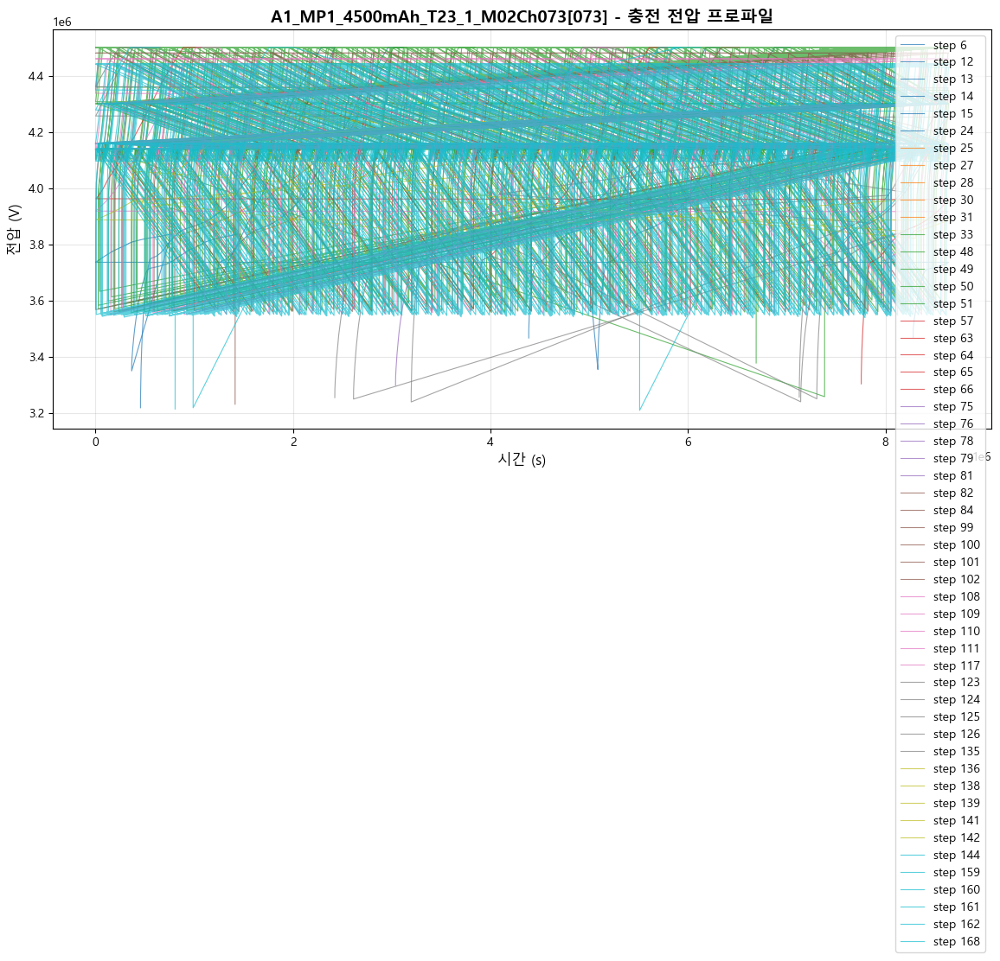

In [17]:
# 충전 데이터만 필터링 (Condition = 1)
if 'sample_df' in locals():
    charge_df = profile_analyzer.filter_by_condition(sample_df, condition=1)
    
    # 충전 전압 프로파일 시각화
    if not charge_df.empty:
        profile_analyzer.visualize_voltage_profile(charge_df, 
                                                   color_by='step',
                                                   title=f"{sample_key} - 충전 전압 프로파일")
else:
    print("⚠️  샘플 데이터가 없습니다.")

### 6. 방전 데이터 필터링 및 분석

✓ 방전 데이터 필터링: 225,593행 (전체의 39.4%)


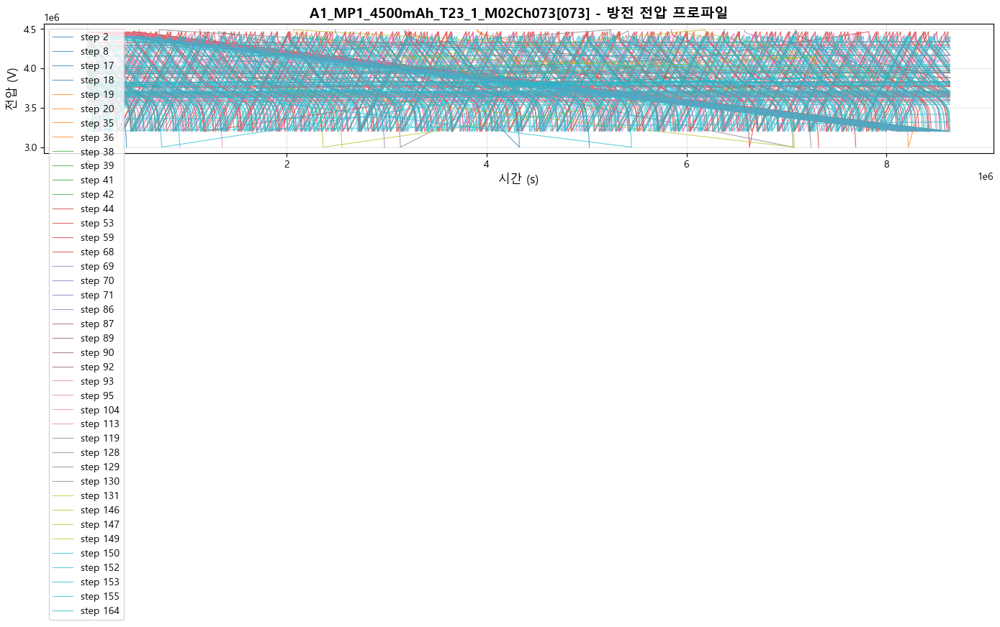

In [18]:
# 방전 데이터만 필터링 (Condition = 2)
if 'sample_df' in locals():
    discharge_df = profile_analyzer.filter_by_condition(sample_df, condition=2)
    
    # 방전 전압 프로파일 시각화
    if not discharge_df.empty:
        profile_analyzer.visualize_voltage_profile(discharge_df, 
                                                   color_by='step',
                                                   title=f"{sample_key} - 방전 전압 프로파일")
else:
    print("⚠️  샘플 데이터가 없습니다.")

### 7. CCCV 충전 구간 식별

✓ CCCV 구간 식별 완료:
  - CC (정전류) 구간: 328,597행 (99.3%)
  - CV (정전압) 구간: 2,397행 (0.7%)


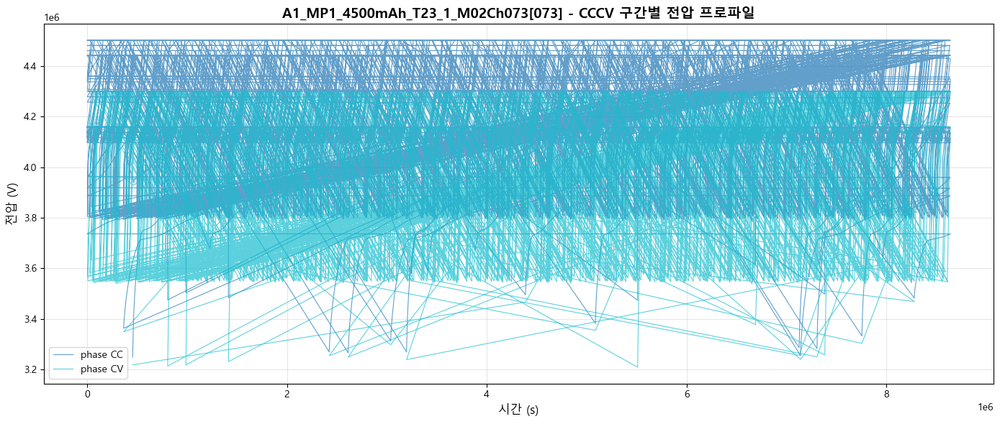

In [19]:
# 충전 데이터에서 CCCV 구간 식별
if 'charge_df' in locals() and not charge_df.empty:
    charge_cccv = profile_analyzer.identify_cccv_phases(charge_df, cv_current_threshold=50.0)
    
    # CCCV 구간별 전압 프로파일
    profile_analyzer.visualize_voltage_profile(charge_cccv, 
                                              color_by='phase',
                                              title=f"{sample_key} - CCCV 구간별 전압 프로파일")
else:
    print("⚠️  충전 데이터가 없습니다.")

### 8. 사이클별 용량 변화 분석

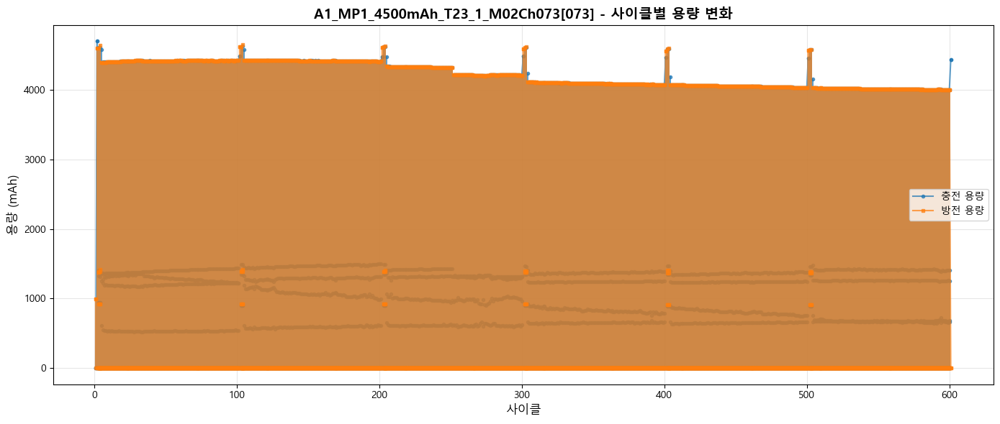

✓ RPT 사이클 식별: 12개
  - 사이클 번호: [np.int64(50), np.int64(100), np.int64(150), np.int64(200), np.int64(250), np.int64(300), np.int64(350), np.int64(400), np.int64(450), np.int64(500)]...


In [20]:
# 사이클 데이터에서 용량 변화 시각화
if loaded_data['pne_cycle']:
    cycle_key = list(loaded_data['pne_cycle'].keys())[0]
    cycle_df = loaded_data['pne_cycle'][cycle_key]
    
    profile_analyzer.visualize_capacity_evolution(cycle_df, 
                                                  title=f"{cycle_key} - 사이클별 용량 변화")
    
    # RPT 사이클 식별 (50 사이클마다)
    rpt_cycles = profile_analyzer.identify_rpt_cycles(cycle_df, rpt_pattern=50)
else:
    print("⚠️  PNE cycle 데이터가 없습니다.")

### 9. 커스텀 분석 (사용자 정의)

아래 셀에서 자유롭게 분석을 수행하세요.

In [21]:
# 예제: 특정 step만 필터링
# filtered_df = profile_analyzer.filter_by_step(sample_df, steps=[1, 2, 3])

# 예제: 전류 프로파일 시각화
# profile_analyzer.visualize_current_profile(sample_df, title="전류 프로파일")

print("이 셀에서 커스텀 분석을 수행하세요.")

이 셀에서 커스텀 분석을 수행하세요.


# Cycle 데이터 구조 분석

In [23]:
# Cycle 데이터 구조 분석
import cycle_analyzer
import importlib
importlib.reload(cycle_analyzer)
# 전체 통계
cycle_analyzer.print_cycle_statistics(cycle_list)
# 구조 요약 테이블
cycle_summary = cycle_analyzer.analyze_cycle_structure(cycle_list)
display(cycle_summary.head(20))

📊 Cycle 데이터 전체 통계

총 사이클 수: 601

데이터 포인트 수:
  평균: 951
  최소: 79
  최대: 52466
  표준편차: 5059

Voltage 범위 (mV):
  평균: 1272
  최소: 781
  최대: 1502

사이클 지속 시간 (s):
  평균: 12740
  최소: 4459
  최대: 70399

컬럼 정보:
  컬럼 수: 18
  컬럼 목록: index, time_day, time_s, Voltage_V, Current_mA, Temp_C, ChgCap_mAh, DchgCap_mAh, Condition, EndState, step, Steptime_s, Cycle, time_min, time_hour, time_cyc, Capa_cyc, Crate



,Cycle_Index,Data_Points,Columns,Column_Names,Voltage_Min,Voltage_Max,Voltage_Range,Current_Min,Current_Max,Duration_s,EndState_Unique,EndState_Values,Condition_Unique,Condition_Types,Crate_Max,Crate_Mean
0,0,79,18,"index, time_day, time_s, Voltage_V, Current_mA...",2999.119,3780.091,780.972,-900.060,0.291,4459.30,3,"0, 64, 65",2,"Discharge, Rest",0.200013,0.167097
1,1,663,18,"index, time_day, time_s, Voltage_V, Current_mA...",2999.112,4500.620,1501.508,-900.098,900.188,39238.15,3,"64, 65, 66",3,"Charge, Discharge, Rest",0.200042,0.187594
2,2,670,18,"index, time_day, time_s, Voltage_V, Current_mA...",2999.117,4500.602,1501.485,-900.074,900.238,38844.05,4,"64, 65, 66, 78",3,"Charge, Discharge, Rest",0.200053,0.186116
3,3,52466,18,"index, time_day, time_s, Voltage_V, Current_mA...",2999.330,4500.567,1501.237,-4500.049,4503.579,70398.65,4,"64, 65, 66, 78",3,"Charge, Discharge, Rest",1.000795,0.101087
4,4,466,18,"index, time_day, time_s, Voltage_V, Current_mA...",3199.008,4500.607,1301.599,-2250.289,9001.679,11813.60,3,"64, 65, 66",3,"Charge, Discharge, Rest",2.000373,1.136334
5,5,452,18,"index, time_day, time_s, Voltage_V, Current_mA...",3199.006,4500.610,1301.604,-2250.289,9004.080,11742.05,3,"64, 65, 66",3,"Charge, Discharge, Rest",2.000907,1.113501
6,6,453,18,"index, time_day, time_s, Voltage_V, Current_mA...",3199.007,4500.578,1301.571,-2250.279,9003.079,11719.35,3,"64, 65, 66",3,"Charge, Discharge, Rest",2.000684,1.118921
7,7,453,18,"index, time_day, time_s, Voltage_V, Current_mA...",3199.009,4500.611,1301.602,-2250.289,9005.080,11724.00,3,"64, 65, 66",3,"Charge, Discharge, Rest",2.001129,1.118941
8,8,454,18,"index, time_day, time_s, Voltage_V, Current_mA...",3198.997,4500.599,1301.602,-2250.289,9003.319,11725.00,3,"64, 65, 66",3,"Charge, Discharge, Rest",2.000738,1.120611
9,9,454,18,"index, time_day, time_s, Voltage_V, Current_mA...",3198.991,4500.597,1301.606,-2250.289,9003.580,11725.45,3,"64, 65, 66",3,"Charge, Discharge, Rest",2.000796,1.120494


c:\Users\Ryu\Python_project\data\dataprocess\cycle_visualizer.py:68: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


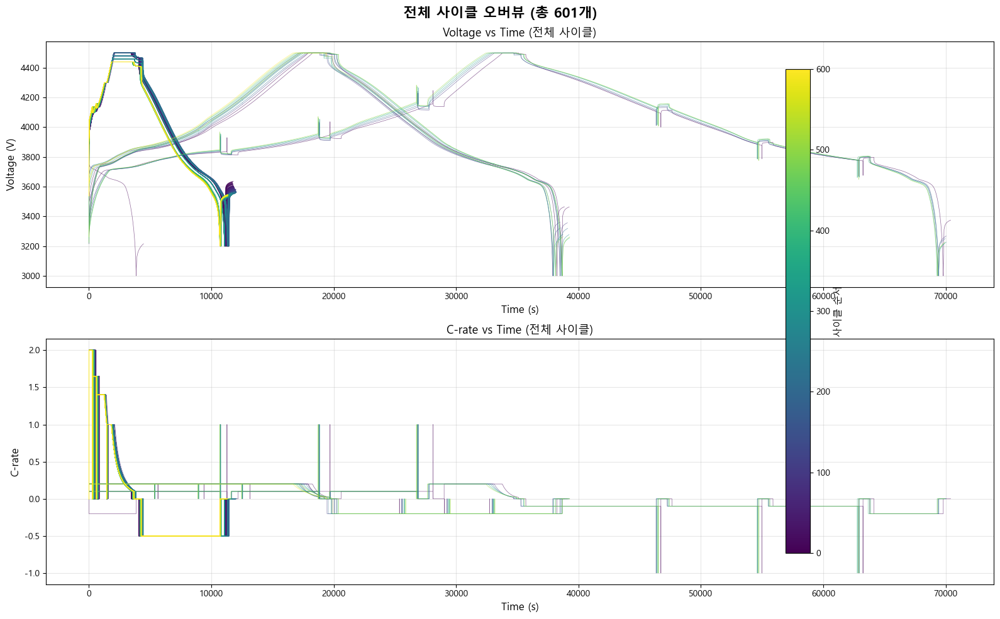

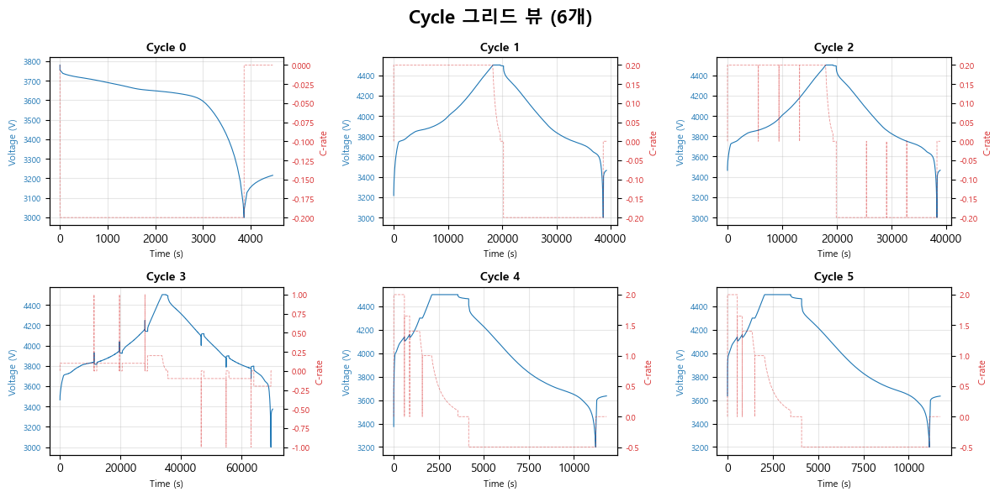

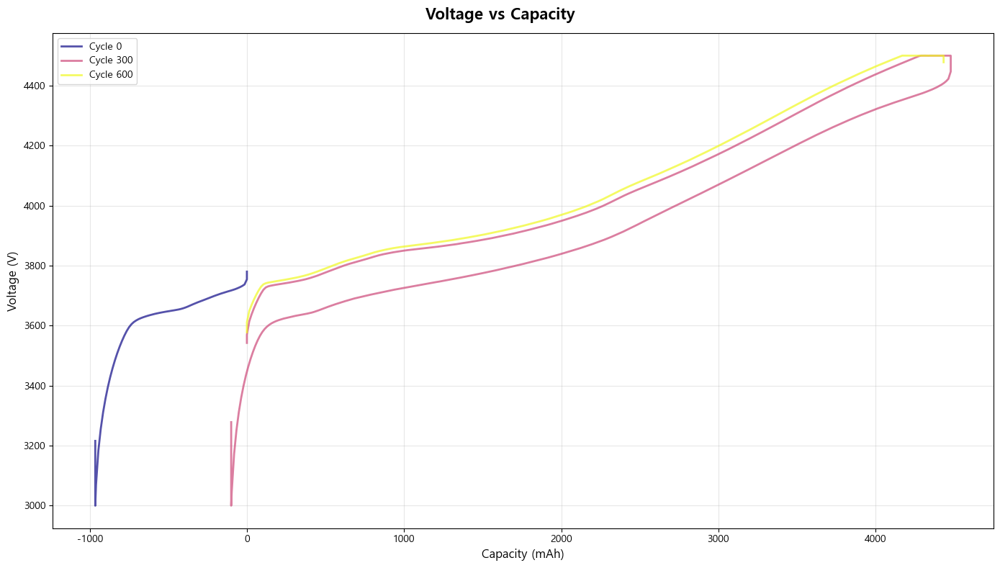

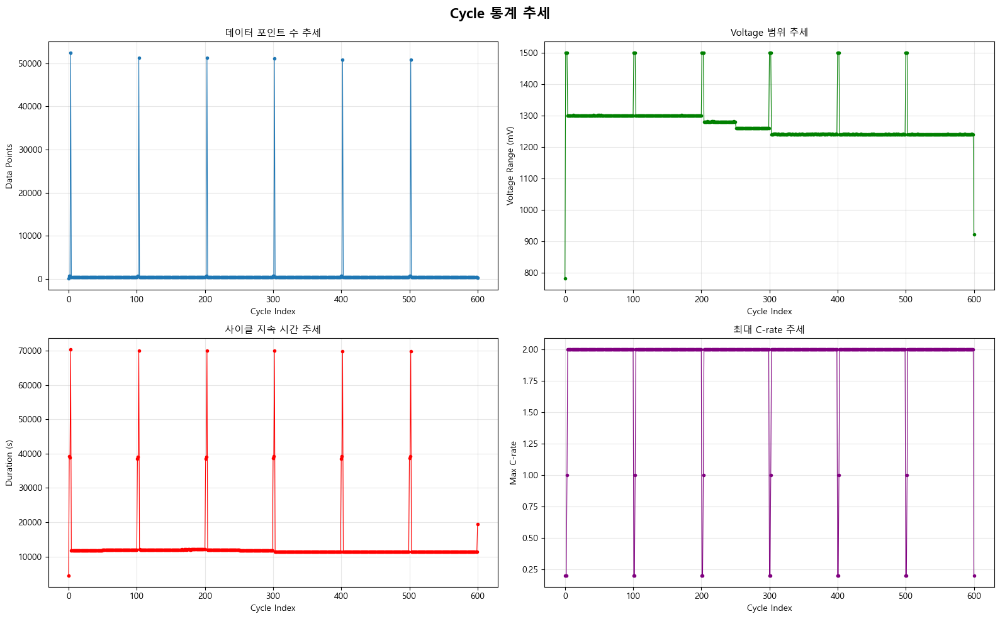

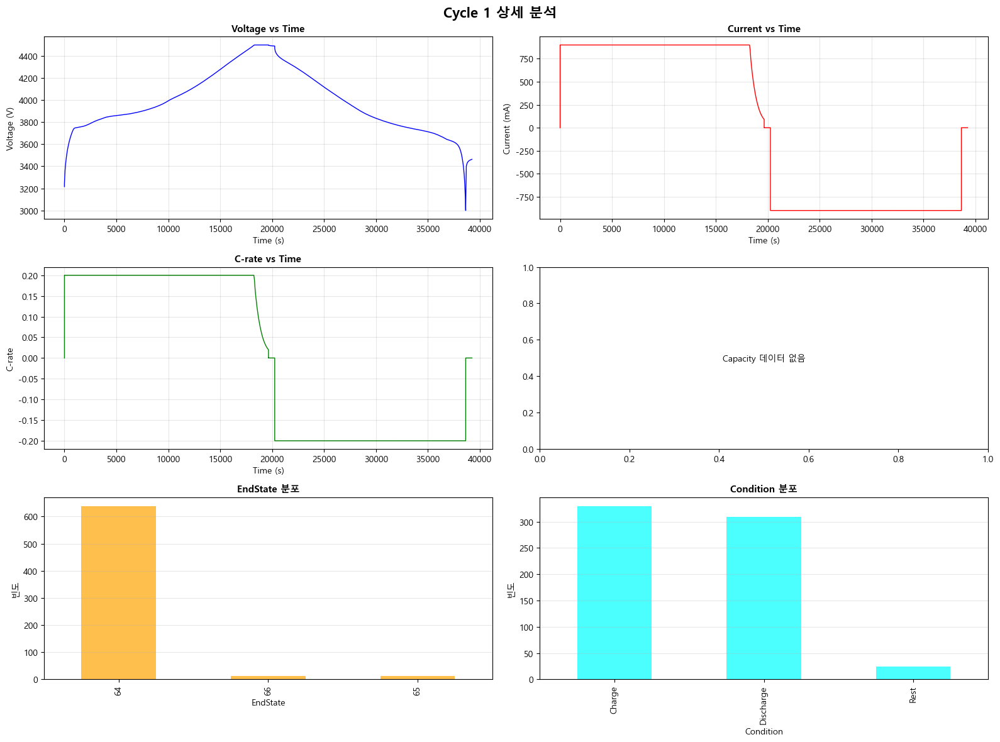

In [24]:
import cycle_visualizer
import importlib
importlib.reload(cycle_visualizer)
# 1. 전체 오버뷰
cycle_visualizer.plot_all_cycles_overview(cycle_list)
plt.show()
# 2. 그리드 뷰
cycle_visualizer.plot_cycle_grid(cycle_list, indices=[0,1,2,3,4,5], cols=3)
plt.show()
# 3. V-Q 곡선
cycle_visualizer.plot_voltage_vs_capacity(cycle_list)
plt.show()
# 4. 통계 추세
cycle_visualizer.plot_cycle_statistics(cycle_list)
plt.show()
# 5. 상세 분석
cycle_visualizer.plot_single_cycle_detailed(cycle_list, cycle_index=1)
plt.show()